<a href="https://colab.research.google.com/github/AkashBhardwaj9078/Demo_git_work/blob/main/Incomplete_plant_disease.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!gdown --id 1Dvw0UpvItjig0JbnzbTgYKB-ibMrXdxk
!unzip -q dogs-vs-cats.zip
!unzip -q train.zip
!unzip -q test1.zip

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1Dvw0UpvItjig0JbnzbTgYKB-ibMrXdxk
From (redirected): https://drive.google.com/uc?id=1Dvw0UpvItjig0JbnzbTgYKB-ibMrXdxk&confirm=t&uuid=f9d186ca-da8a-48b0-beb8-7a42a9dbe80e
To: /content/dogs-vs-cats.zip
100% 852M/852M [00:24<00:00, 34.6MB/s]


In [ ]:
# prompt: dowmload catvsdogs data

!gdown --id 1Dvw0UpvItjig0JbnzbTgYKB-ibMrXdxk

!unzip -q train.zip
!unzip -q test1.zip


In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, InputLayer, BatchNormalization, Input, Dropout, RandomFlip, RandomRotation, Resizing, Rescaling
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.metrics import BinaryAccuracy, FalsePositives, FalseNegatives, TruePositives, TrueNegatives, Precision, Recall, AUC, binary_accuracy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback, CSVLogger, EarlyStopping, LearningRateScheduler, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers  import L2, L1
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import tensorflow_probability as tfp

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import image_dataset_from_directory

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds


In [ ]:
ds=image_dataset_from_directory(
 "/content/drive/MyDrive/potato_dataset/archive (11)",
     color_mode="rgb",
    image_size=(256,256),
    batch_size=32,
    label_mode="categorical",
    shuffle=True,
    seed=42,


)

Found 2152 files belonging to 3 classes.


In [ ]:
len(ds)

68

In [ ]:
def split(ds,train_ratio,val_ratio):
  n=len(ds)
  ds_train=ds.take(int(n*train_ratio))
  ds_val=ds.skip(len(ds_train)).take(int(n*(val_ratio)))
  return ds_train,ds_val


ds_train,ds_val=split(ds,0.8,0.2)

In [ ]:
classes=ds.class_names
classes

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [ ]:
import numpy as np

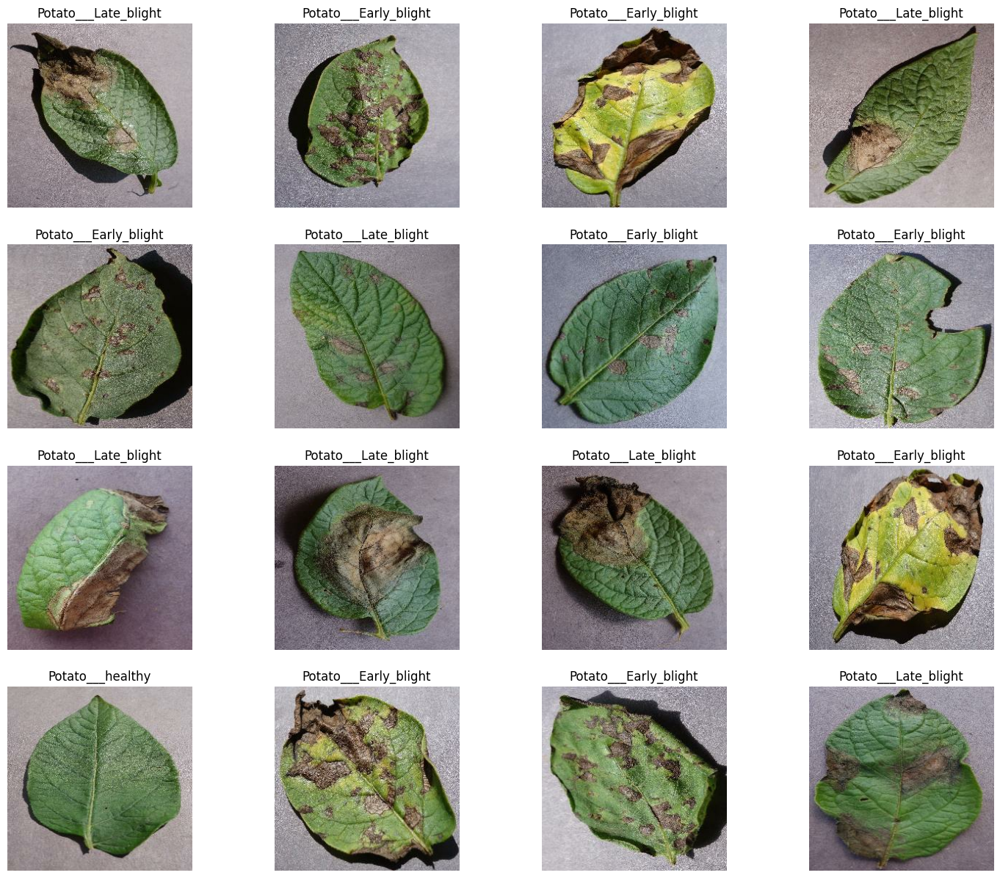

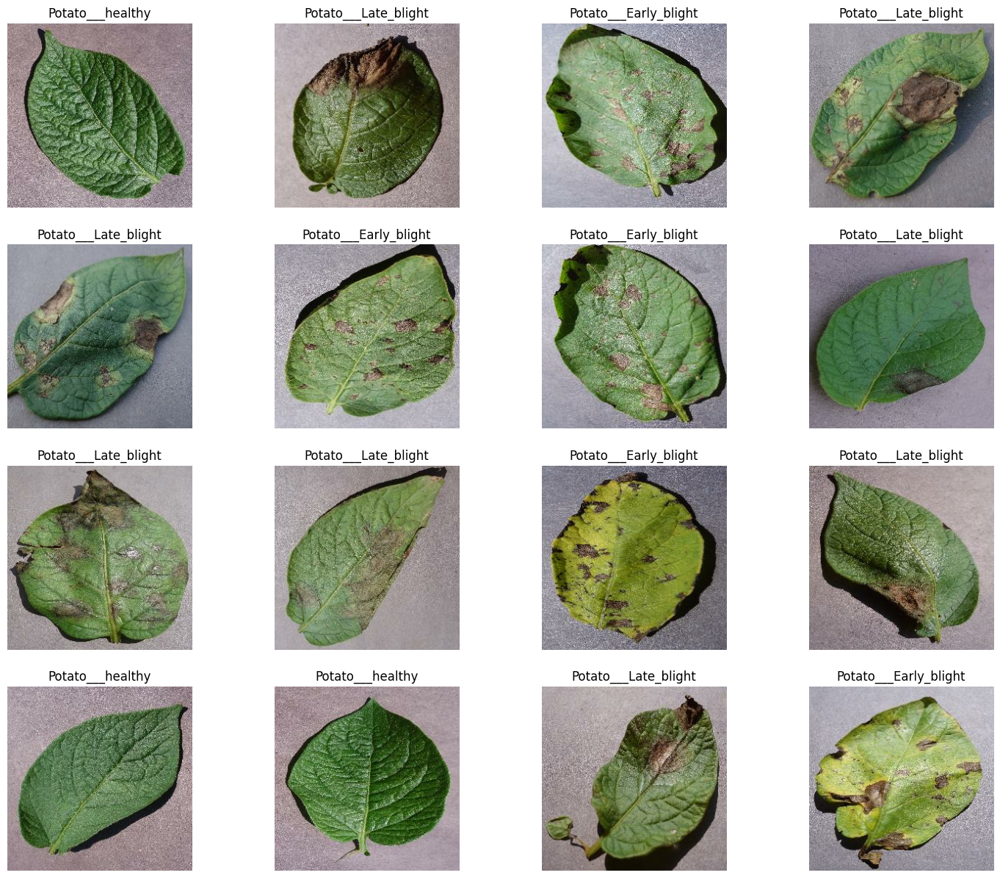

In [ ]:
for img,labels in ds.take(2):
  plt.figure(figsize=(18,15))
  for i in range(16):
    plt.subplot(4,4,i+1)
    plt.imshow(img[i].numpy().astype("uint32"))
    plt.axis("off")
    # print(np.argamax(labels[i]))
    plt.title(classes[np.argmax(labels[i])])

In [ ]:

import cv2
def bounding_crop(img):


  gray=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  edge=cv2.Canny(gray,30,100)
  contours,hierarchy=cv2.findContours(edge,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
  cnt=max(contours,key=cv2.contourArea)
  x,y,w,h=cv2.boundingRect(cnt)
  return img[y:y+h,x:x+h]





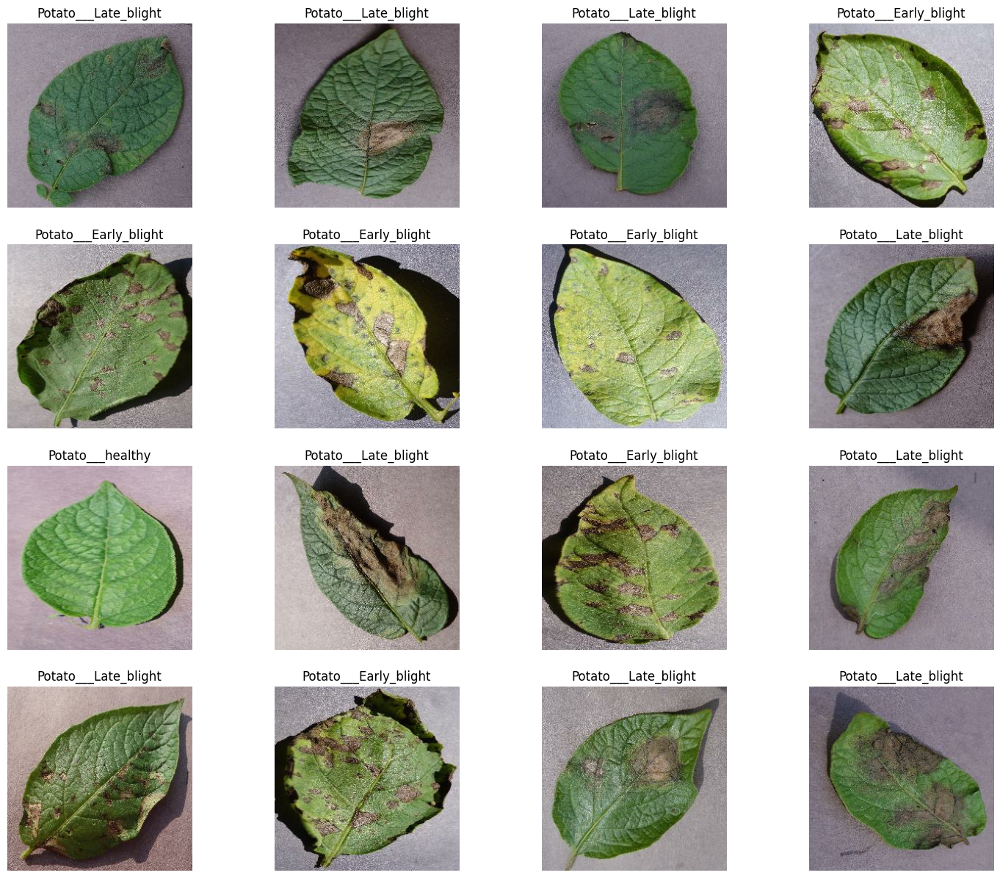

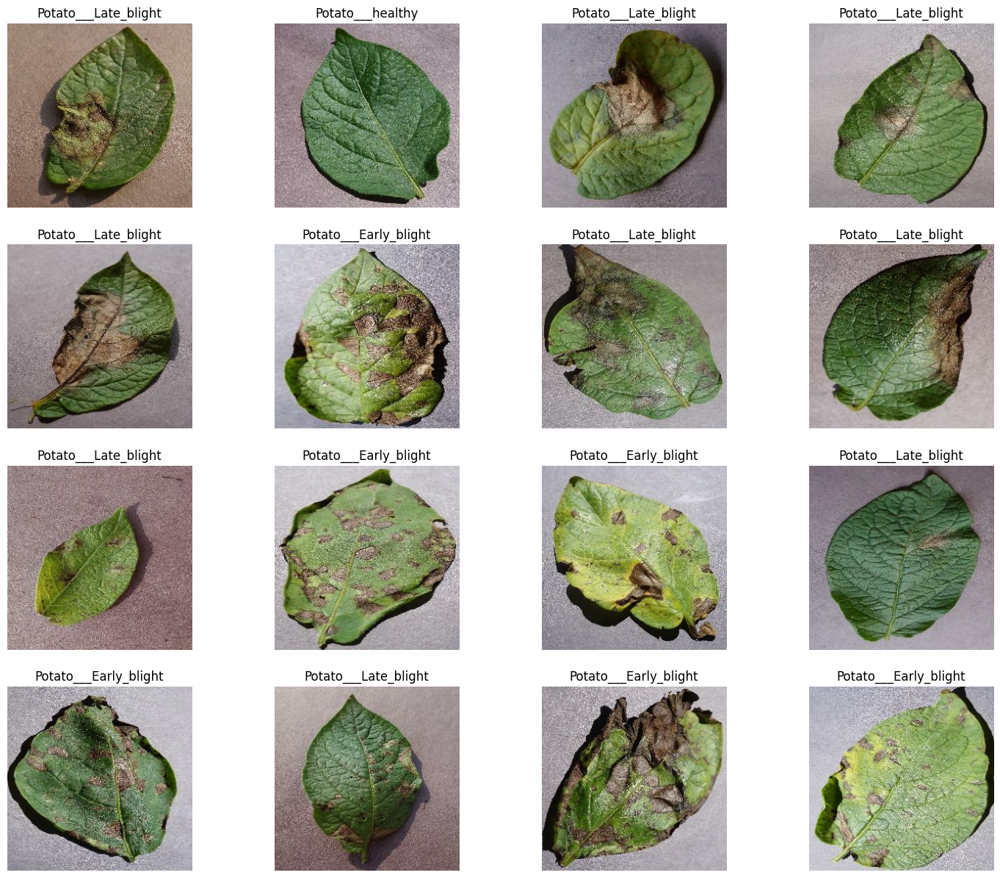

In [ ]:
for img,labels in ds.take(2):
  plt.figure(figsize=(18,15))
  for i in range(16):
    plt.subplot(4,4,i+1)
    img_r=img[i].numpy().astype("uint32")

    plt.imshow(img_r)
    plt.axis("off")

    plt.title(classes[np.argmax(labels[i])])

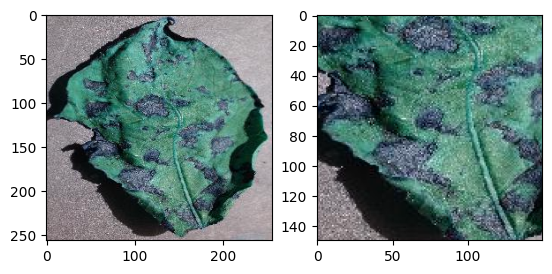

In [ ]:
img="/content/drive/MyDrive/potato_dataset/archive (11)/Potato___Early_blight/001187a0-57ab-4329-baff-e7246a9edeb0___RS_Early.B 8178.JPG"
img=cv2.imread(img)
crp_img=bounding_crop(img)




plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(crp_img)


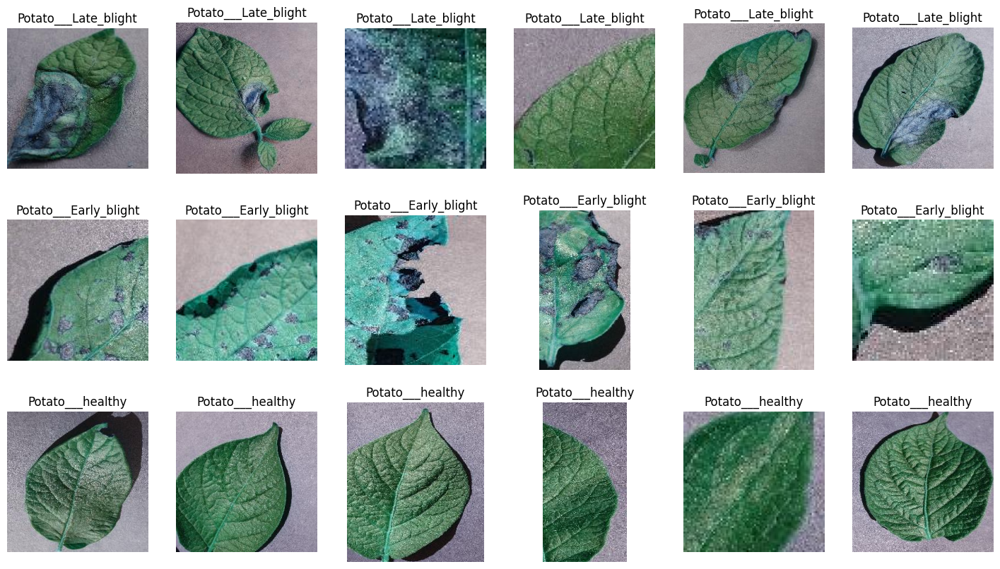

In [ ]:
import os
pth="/content/drive/MyDrive/potato_dataset/archive (11)"
file_p=[os.path.join(pth,file_s) for file_s in os.listdir(pth) ]
fig,axes=plt.subplots(3,6,figsize=(18,10))
axes=axes.ravel()
idx=0
for files in file_p:
  img_p=[os.path.join(files,img) for img in os.listdir(files)]
  for i in range(6):
    bound=bounding_crop(cv2.imread(img_p[i]))
    axes[idx].imshow(bound)
    axes[idx].axis("off")
    axes[idx].set_title(files.split("/")[-1])
    idx+=1



In [ ]:

resize_rescale_layers = tf.keras.Sequential([
     tf.keras.layers.Resizing(224, 224),
     tf.keras.layers.Rescaling(1./255),
])


def resize_rescale(img,lab):
  img=tf.image.resize(img,(224,224))

  return img,lab




augment_layers = tf.keras.Sequential([
       tf.keras.layers.RandomRotation(factor = (0.25, 0.2501),),
       tf.keras.layers.RandomFlip(mode='horizontal',),
       tf.keras.layers.RandomContrast(factor=0.1),

])


def augment_layer(image, label):
  return augment_layers(resize_rescale_layers(image), training = True), label

In [ ]:
aug_train=ds_train.map(augment_layer)
aug_test=ds_val.map(resize_rescale)


In [ ]:
def box(lam):
  rx=tf.cast(tfp.distributions.Uniform(0,224).sample(1)[0],tf.int32)
  ry=tf.cast(tfp.distributions.Uniform(0,224).sample(1)[0],tf.int32)

  rw=tf.cast(256*tf.math.sqrt(1-lam),tf.int32)
  rh=tf.cast(256*tf.math.sqrt(1-lam),tf.int32)

  rx=tf.clip_by_value(rx-rw//2,0,224)
  ry=tf.clip_by_value(ry-rh//2,0,224)

  rx_t=tf.clip_by_value(rx+rw//2,0,224)
  ry_t=tf.clip_by_value(ry+rh//2,0,224)

  rw=rx_t-rx
  if rw==0:
    rw=1
  rh=ry_t-ry
  if rh==0:
    rh=1


  return rx,ry,rw,rh

In [ ]:
def cutmix(train_img1,train_img2):

  (img1,lab1),(img2,lab2)=train_img1,train_img2
  lam=tfp.distributions.Beta(0.3,0.3).sample(1)[0]
  rx,ry,rw,rh=box(lam)
  crp_img1=tf.image.crop_to_bounding_box(img1,ry,rx,rh,rw)
  pad_img1=tf.image.pad_to_bounding_box(crp_img1,rx,ry,224,224)

  crp_img2=tf.image.crop_to_bounding_box(img2,ry,rx,rh,rw)
  pad_img2=tf.image.pad_to_bounding_box(crp_img2,rx,ry,224,224)
  image=img1-pad_img1+pad_img2

  lamda=tf.cast(1-((rw*rh)/(224*224)),tf.float32)

  label=lamda*lab1+(1-lamda)*lab2
  return image,label


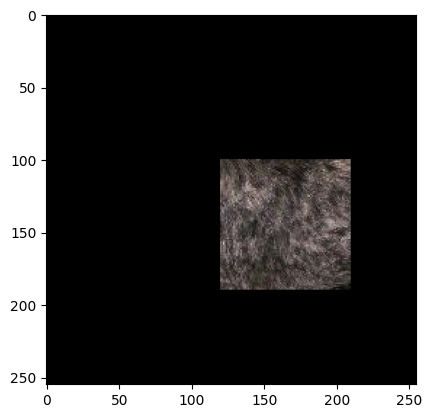

In [ ]:
for img,label in ds_test:
  crp_img=tf.image.crop_to_bounding_box(img,100,120,90,90)
  pad_img=tf.image.pad_to_bounding_box(crp_img,100,120,255,255)
  plt.imshow(pad_img[0].numpy().astype("uint32"))

  break

In [ ]:
import tensorflow as tf
class LeNet:
    def __init__(self,filter):
        self.conv1 = Conv2D(filter, 5)
        self.pool1 = tf.keras.layers.MaxPooling2D(2)
        self.conv2 = Conv2D(16, 5)
        self.pool2 =tf.keras.layers.MaxPooling2D(2)
        self.flatten = Flatten()
        self.dense1 = Dense(120, activation='relu')
        self.dense2 = Dense(84, activation='relu')
        self.dense3 = Dense(3, activation='softmax')

    def __call__(self, input):
        x = self.conv1(input)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.pool2(x)
        x = self.flatten(x)
        x = self.dense1(x)
        x = self.dense2(x)
        x = self.dense3(x)
        return x


In [ ]:
y=tf.keras.layers.Input(shape=(224,224,3))
model=LeNet(6)
out_vgg = model(y)
x=tf.keras.layers.Flatten()(out_vgg)
x=tf.keras.layers.Dense(1024,activation="relu")(x)
x=tf.keras.layers.Dropout(0.5)(x)
x=tf.keras.layers.Dense(512,activation="relu")(x)
x=tf.keras.layers.Dropout(0.5)(x)
x=tf.keras.layers.Dense(10,activation="softmax")(x)


mod=tf.keras.models.Model(inputs=y,outputs=x)
mod.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d_2 (Conv2D)           (None, 220, 220, 6)       456       
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 110, 110, 6)       0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 16)      2416      
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 53, 53, 16)        0         
 g2D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 44944)             0   

In [ ]:
mod.save("mod.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

cp = ModelCheckpoint("mod.h5",
                             monitor="val_loss",
                             mode="min",
                             save_best_only = True,
                             verbose=1)

es = EarlyStopping(monitor = 'val_loss',
                          min_delta = 0,
                          patience = 5,
                          verbose = 1,
                          restore_best_weights = True)

In [ ]:
from tensorflow.keras.metrics import TruePositives,TrueNegatives,FalseNegatives,FalsePositives,BinaryAccuracy,Precision,Recall

metrics = [TruePositives(name='tp'),FalsePositives(name='fp'), TrueNegatives(name='tn'), FalseNegatives(name='fn'),
            BinaryAccuracy(name='accuracy'), Precision(name='precision'), Recall(name='recall'), AUC(name='auc')]
log=tf.keras.callbacks.TensorBoard(log_dir="logs")

In [ ]:
def cat_entrpoy(factor):
  def loss(y_pred,y_test):
    cce=tf.keras.losses.CategoricalCrossentropy(y_pred,y_test,from_logits=False)
    return cce*factor

  return loss





In [ ]:
file_writer=tf.summary.create_file_writer("logs/metrics")
def scheduler(epochs,lr):
  if epochs<=1:
    learning_rate=lr
  else :
    learning_rate=lr*tf.math.exp(-0.1)
    learning_rate=learning_rate.numpy()

  with file_writer.as_default():
    tf.summary.scalar("learning_rate",data=learning_rate,step=epochs)

  return learning_rate




scheduler_callback=tf.keras.callbacks.LearningRateScheduler(scheduler,verbose=1)

In [ ]:
mod.compile(
    optimizer="adam",
    loss="categorical_crossentropy",
    metrics=["accura"]
)

In [ ]:
mod.fit(
    aug_train,
    validation_data=aug_test,
    batch_size=32,
    verbose=1,


)

TypeError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "<ipython-input-118-1ce67f860d7f>", line 3, in loss  *
        cce=tf.keras.losses.CategoricalCrossentropy(y_pred,y_test,from_logits=False)

    TypeError: CategoricalCrossentropy.__init__() got multiple values for argument 'from_logits'
